##Setup and Install Dependencies

In [ ]:
# Import libraries
import tensorflow as tf
import pandas as pd
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
import seaborn as sns
import numpy as np
import os
import zipfile
import json




In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Dataset Setup

In [ ]:
!curl -L -o master.zip https://www.kaggle.com/api/v1/datasets/download/ankurpaul52/balanced-multi-crop-plant-disease-dataset
!unzip -q  master.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 7526M  100 7526M    0     0  97.6M      0  0:01:17  0:01:17 --:--:--  135M


## Data Preparation and Exploration
 Split dataset into train/val/test folders

In [ ]:
import shutil
import random
from pathlib import Path

def split_dataset(source_dir, dest_dir, train_ratio=0.7, val_ratio=0.15, test_ratio=0.15):

    # Ensure ratios sum to 1
    assert abs(train_ratio + val_ratio + test_ratio - 1.0) < 0.01, "Ratios must sum to 1"

    # Create destination directories
    train_dir = os.path.join(dest_dir, 'train')
    val_dir = os.path.join(dest_dir, 'val')
    test_dir = os.path.join(dest_dir, 'test')

    # Create directories if they don't exist
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)

    # Get all class folders (disease types)
    class_folders = [f for f in os.listdir(source_dir)
                    if os.path.isdir(os.path.join(source_dir, f))]

    print(f"Found {len(class_folders)} classes: {class_folders}")

    # Process each class separately
    for class_name in class_folders:
        class_path = os.path.join(source_dir, class_name)

        # Create class folders in train/val/test
        os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
        os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)
        os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)

        # Get all image files for this class
        image_files = [f for f in os.listdir(class_path)
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

        # Shuffle the files
        random.shuffle(image_files)

        # Calculate split pointsr
        n_total = len(image_files)
        n_train = int(n_total * train_ratio)
        n_val = int(n_total * val_ratio)
        n_test = n_total - n_train - n_val  # Remainder goes to test

        print(f"\nClass '{class_name}': {n_total} images")
        print(f"  Train: {n_train}, Val: {n_val}, Test: {n_test}")

        # Split the files
        train_files = image_files[:n_train]
        val_files = image_files[n_train:n_train + n_val]
        test_files = image_files[n_train + n_val:]

        # Copy files to respective folders
        for file_name in train_files:
            src = os.path.join(class_path, file_name)
            dst = os.path.join(train_dir, class_name, file_name)
            shutil.copy2(src, dst)

        for file_name in val_files:
            src = os.path.join(class_path, file_name)
            dst = os.path.join(val_dir, class_name, file_name)
            shutil.copy2(src, dst)

        for file_name in test_files:
            src = os.path.join(class_path, file_name)
            dst = os.path.join(test_dir, class_name, file_name)
            shutil.copy2(src, dst)

    print(f"\nDataset split completed!")
    print(f"Organized data saved to: {dest_dir}")




In [ ]:
# Define dataset paths - adjust these based on your dataset structure
BASE_DIR = '/content/datasets/tomato'
TOMATO_DIR = os.path.join('Tomato')
split_dataset(BASE_DIR, TOMATO_DIR, train_ratio=0.8, val_ratio=0.1, test_ratio=0.1)

Found 10 classes: ['Tomato___healthy', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Target_Spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Leaf_Mold', 'Tomato___Late_blight', 'Tomato___Septoria_leaf_spot', 'Tomato___Early_blight', 'Tomato___Bacterial_spot', 'Tomato___Tomato_mosaic_virus']

Class 'Tomato___healthy': 1200 images
  Train: 960, Val: 120, Test: 120

Class 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 1200 images
  Train: 960, Val: 120, Test: 120

Class 'Tomato___Target_Spot': 1200 images
  Train: 960, Val: 120, Test: 120

Class 'Tomato___Spider_mites Two-spotted_spider_mite': 1200 images
  Train: 960, Val: 120, Test: 120

Class 'Tomato___Leaf_Mold': 1200 images
  Train: 960, Val: 120, Test: 120

Class 'Tomato___Late_blight': 1200 images
  Train: 960, Val: 120, Test: 120

Class 'Tomato___Septoria_leaf_spot': 1200 images
  Train: 960, Val: 120, Test: 120

Class 'Tomato___Early_blight': 1200 images
  Train: 960, Val: 120, Test: 120

Class 'Tomato___Bacteri

## Data Preprocessing and Augmentation

Augmentation should be handled based on the availability of data. If you have limited data (say a few hundred images) then aggressive augmentation can result in inefficient training. Because in that case the the images will become too different for model to learn patterns. In such a case go with low augmentation.
This method does not increase the number of images.

In [ ]:
# Configuration
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
VALIDATION_SPLIT = 0.2
RANDOM_SEED = 42

# Set random seeds
tf.random.set_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

BASE_DIR = '/content/Tomato'
TRAIN_DIR = os.path.join(BASE_DIR, 'train')
VAL_DIR = os.path.join(BASE_DIR, 'val')
TEST_DIR = os.path.join(BASE_DIR, 'test')

# Data augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    brightness_range=[0.5, 1.5],
    shear_range=0.2,
    zoom_range=0.3,
    channel_shift_range=0.2,
    fill_mode='reflect',
    horizontal_flip=True,

)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Create data generators
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=RANDOM_SEED
)

validation_generator = val_datagen.flow_from_directory(
    VAL_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    seed=RANDOM_SEED
)

test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    seed=RANDOM_SEED
)


Found 9600 images belonging to 10 classes.
Found 1200 images belonging to 10 classes.
Found 1200 images belonging to 10 classes.


In [ ]:
# Get class information
num_classes = len(train_generator.class_indices)
class_names = list(train_generator.class_indices.keys())

print(f"Number of classes: {num_classes}")
print(f"Class names: {class_names}")

Number of classes: 10
Class names: ['Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']


## Visualize Sample Images

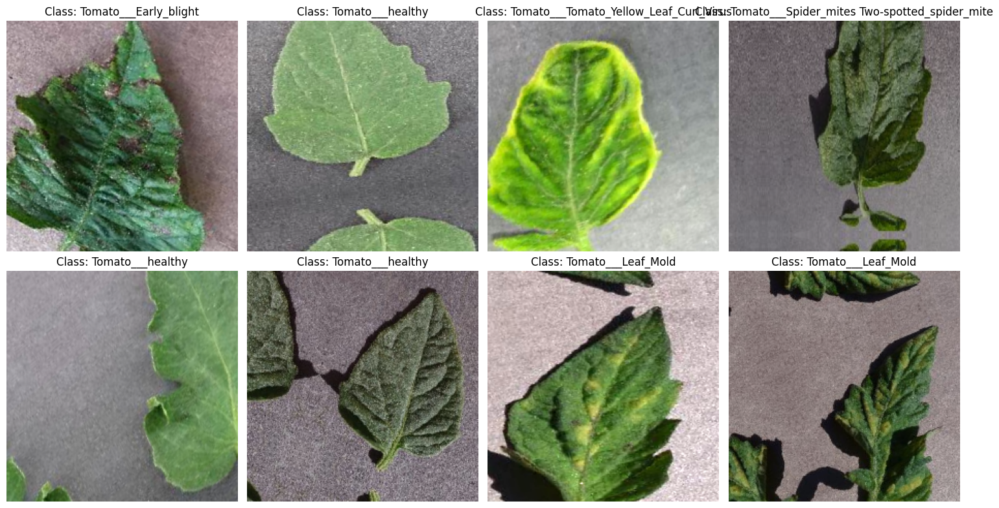

In [ ]:
def plot_sample_images(generator, class_names, num_images=8):
    fig, axes = plt.subplots(2, 4, figsize=(15, 8))
    axes = axes.ravel()

    # Get a batch of images
    images, labels = next(generator)

    for i in range(min(num_images, len(images))):
        img = images[i]
        label_idx = np.argmax(labels[i])
        class_name = class_names[label_idx]

        axes[i].imshow(img)
        axes[i].set_title(f'Class: {class_name}')
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Display sample images
plot_sample_images(train_generator, class_names)

##  Build MobileNetV2 Model

1. **Feature extractor (MobileNetV2)** - recognizes patterns
2. **Classifier head** - makes final disease prediction

This version keeps the base model in inference mode during fine-tuning, similar to the Keras [Xception example](https://keras.io/guides/transfer_learning/). This is an easy pitfall which can often go unnoticed. The BatchNormalization layers should be kept frozen (Non trainable) even if the base model (In this case MobileNetV2) is being fine tuned otherwise the accuracy can drop drastically in the first epoch of fine tune.

In [ ]:
def create_mobilenet_model(num_classes, img_size=(224, 224, 3)):

    # Load pre-trained MobileNetV2 (without top layer)
    base_model = MobileNetV2(
        input_shape=img_size,
        include_top=False,
        weights='imagenet',
        alpha=1.0  # Width multiplier
    )

    # Freeze base model initially
    base_model.trainable = False

    # Create model using Functional API to control training mode
    from tensorflow.keras import Input, Model
    inputs = Input(shape=img_size)

    x = base_model(inputs, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(32, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)

    return model, base_model

In [ ]:
# Create the model
model, base_model = create_mobilenet_model(num_classes)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │        40,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │           330 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,299,434 (8.77 MB)

 Trainable params: 41,386 (161.66 KB)

 Non-trainable params: 2,258,048 (8.61 MB)

##  Model Compilation and Callbacks

In [ ]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
callbacks = [
    # Save best model based on validation accuracy
    ModelCheckpoint(
        '/content/drive/MyDrive/models/best_model.keras',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max'
    ),

    # Stop training if no improvement
    EarlyStopping(
        monitor='val_accuracy',
        patience=7,
        restore_best_weights=True
    ),

    # Reduce learning rate when stuck
    ReduceLROnPlateau(
        monitor='val_accuracy',
        factor=0.5,
        patience=3,
        min_lr=1e-6
    )
]

## Initial Training (Feature Extraction)

In [ ]:
print("Stage 1: Training classifier head (base model frozen)")
print("="*50)

# Train only the classifier head first
EPOCHS_STAGE1 = 10

history_stage1 = model.fit(
    train_generator,
    epochs=EPOCHS_STAGE1,
    validation_data=validation_generator,
    callbacks=callbacks
)

Stage 1: Training classifier head (base model frozen)
Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 166s 526ms/step - accuracy: 0.4626 - loss: 1.6344 - val_accuracy: 0.7225 - val_loss: 0.8453 - learning_rate: 0.0010
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 152s 506ms/step - accuracy: 0.6931 - loss: 0.9396 - val_accuracy: 0.7800 - val_loss: 0.6854 - learning_rate: 0.0010
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 150s 498ms/step - accuracy: 0.7453 - loss: 0.8026 - val_accuracy: 0.7925 - val_loss: 0.6535 - learning_rate: 0.0010
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 159s 531ms/step - accuracy: 0.7510 - loss: 0.7425 - val_accuracy: 0.8108 - val_loss: 0.5735 - learning_rate: 0.0010
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 162s 541ms/step - accuracy: 0.7656 - loss: 0.7040 - val_accuracy: 0.8042 - val_loss: 0.5663 - learning_rate: 0.0010
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 152s 506ms/step - accuracy: 0.7579 - loss: 0.7167 - val_accuracy: 0.8125 - val_loss: 0.5450 - learning_rate: 0.0010
Epoch 7/10

## Fine-tuning (Unfreeze Base Model)

In [ ]:
print(len(base_model.layers))

154


In [ ]:
# Unfreeze the base model for fine-tuning
base_model.trainable = True

# Fine-tune from this layer onwards
fine_tune_at = -20

# Freeze all layers before fine_tune_at
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# Keep all BatchNormalization layers frozen
for layer in base_model.layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False

# Recompile with lower learning rate for fine-tuning
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │        40,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │           330 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,299,434 (8.77 MB)

 Trainable params: 1,236,266 (4.72 MB)

 Non-trainable params: 1,063,168 (4.06 MB)

In [ ]:
print(f"Trainable layers: {sum(1 for layer in base_model.layers if layer.trainable)}")

Trainable layers: 13


In [ ]:
print("\nStage 2: Fine-tuning model")
print("="*50)

# Continue training
EPOCHS_STAGE2 = 10

history_stage2 = model.fit(
    train_generator,
    epochs=EPOCHS_STAGE2,
    validation_data=validation_generator,
    callbacks=callbacks
)


Stage 2: Fine-tuning model
Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 167s 525ms/step - accuracy: 0.7967 - loss: 0.6234 - val_accuracy: 0.8508 - val_loss: 0.4628 - learning_rate: 1.0000e-05
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 151s 503ms/step - accuracy: 0.8110 - loss: 0.5788 - val_accuracy: 0.8392 - val_loss: 0.4725 - learning_rate: 1.0000e-05
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 152s 506ms/step - accuracy: 0.8115 - loss: 0.5658 - val_accuracy: 0.8600 - val_loss: 0.4408 - learning_rate: 1.0000e-05
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 153s 511ms/step - accuracy: 0.8270 - loss: 0.5351 - val_accuracy: 0.8675 - val_loss: 0.4114 - learning_rate: 1.0000e-05
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 151s 503ms/step - accuracy: 0.8317 - loss: 0.5038 - val_accuracy: 0.8667 - val_loss: 0.4064 - learning_rate: 1.0000e-05
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 151s 504ms/step - accuracy: 0.8269 - loss: 0.5201 - val_accuracy: 0.8758 - val_loss: 0.3812 - learning_rate: 1.0000e-05
Epoch 7/10
3

## Training Visualization

In [ ]:
def plot_training_history(history1, history2=None):

    # Combine histories
    if history2:
        acc = history1.history['accuracy'] + history2.history['accuracy']
        val_acc = history1.history['val_accuracy'] + history2.history['val_accuracy']
        loss = history1.history['loss'] + history2.history['loss']
        val_loss = history1.history['val_loss'] + history2.history['val_loss']
        epochs_range = range(len(acc))
        stage1_epochs = len(history1.history['accuracy'])
    else:
        acc = history1.history['accuracy']
        val_acc = history1.history['val_accuracy']
        loss = history1.history['loss']
        val_loss = history1.history['val_loss']
        epochs_range = range(len(acc))
        stage1_epochs = 0

    plt.figure(figsize=(12, 4))

    # Plot accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    if stage1_epochs > 0:
        plt.axvline(x=stage1_epochs-1, color='red', linestyle='--', alpha=0.7, label='Fine-tuning starts')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    if stage1_epochs > 0:
        plt.axvline(x=stage1_epochs-1, color='red', linestyle='--', alpha=0.7, label='Fine-tuning starts')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')

    plt.tight_layout()
    plt.show()

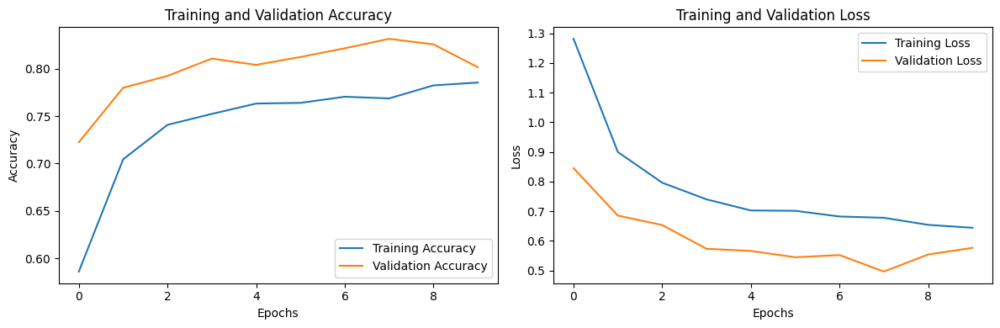

In [ ]:
# Plot training history
plot_training_history(history_stage1) # history_stage2

## Model Evaluation

In [ ]:
# Load the best model
model = tf.keras.models.load_model('/content/drive/MyDrive/models/best_model.keras')

In [ ]:
# Evaluate on test set
print("Final Model Evaluation:")
print("="*30)

test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Validation Loss: {test_loss:.4f}")
print(f"Validation Accuracy: {test_accuracy:.4f}")
# print(f"Validation Top-3 Accuracy: {test_top3_accuracy:.4f}")

Final Model Evaluation:


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


38/38 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - accuracy: 0.8397 - loss: 0.4725
Validation Loss: 0.3504
Validation Accuracy: 0.8800


In [ ]:
# Generate predictions for detailed analysis
test_generator.reset()  # Reset generator
predictions = model.predict(test_generator, verbose=1)
predicted_classes = np.argmax(predictions, axis=1)

# Get true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 182ms/step


In [ ]:
# Classification report
print("\nClassification Report:")
print("="*50)

# Get the actual class labels from the test generator
actual_class_labels = list(test_generator.class_indices.keys())

print(classification_report(true_classes, predicted_classes, target_names=actual_class_labels))


Classification Report:
                                               precision    recall  f1-score   support

                      Tomato___Bacterial_spot       0.85      0.92      0.88       120
                        Tomato___Early_blight       0.89      0.63      0.74       120
                         Tomato___Late_blight       0.92      0.88      0.90       120
                           Tomato___Leaf_Mold       0.81      0.87      0.84       120
                  Tomato___Septoria_leaf_spot       0.87      0.86      0.87       120
Tomato___Spider_mites Two-spotted_spider_mite       0.92      0.81      0.86       120
                         Tomato___Target_Spot       0.78      0.93      0.85       120
       Tomato___Tomato_Yellow_Leaf_Curl_Virus       0.99      0.97      0.98       120
                 Tomato___Tomato_mosaic_virus       0.96      0.99      0.98       120
                             Tomato___healthy       0.84      0.94      0.89       120

                 

## Confusion Matrix

Label Legend:
BS: Bacterial_spot
EB: Early_blight
LB: Late_blight
LM: Leaf_Mold
SLS: Septoria_leaf_spot
SM: Spider_mites Two-spotted_spider_mite
TS: Target_Spot
TYLCV: Tomato_Yellow_Leaf_Curl_Virus
TMV: Tomato_mosaic_virus
H: healthy


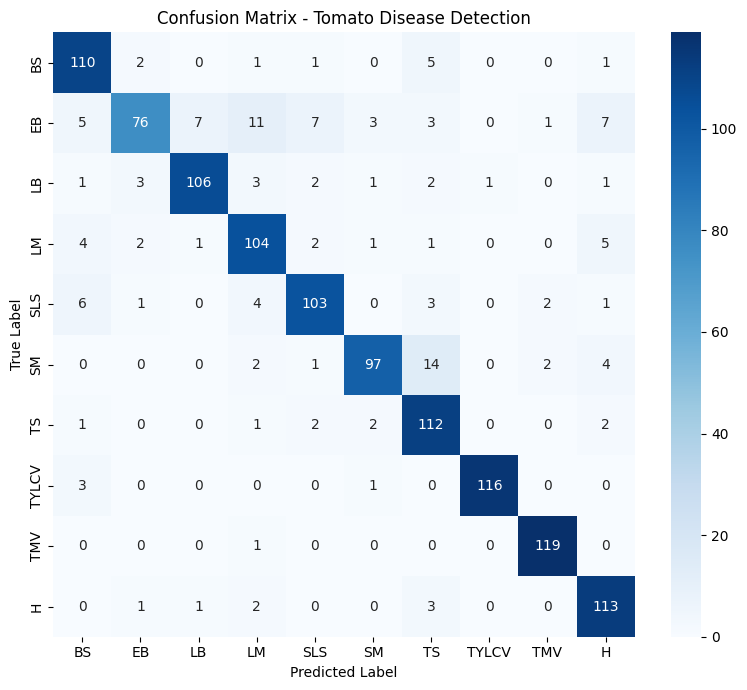

In [ ]:
# Create ultra-short labels
label_mapping = {
    'Tomato___Bacterial_spot': 'BS',
    'Tomato___Early_blight': 'EB',
    'Tomato___Late_blight': 'LB',
    'Tomato___Leaf_Mold': 'LM',
    'Tomato___Septoria_leaf_spot': 'SLS',
    'Tomato___Spider_mites Two-spotted_spider_mite': 'SM',
    'Tomato___Target_Spot': 'TS',
    'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 'TYLCV',
    'Tomato___Tomato_mosaic_virus': 'TMV',
    'Tomato___healthy': 'H'
}

# Convert your class labels to short forms
short_labels = [label_mapping.get(label, label[:3]) for label in class_labels]

# Plot confusion matrix with short labels
plt.figure(figsize=(8, 7))
cm = confusion_matrix(true_classes, predicted_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=short_labels, yticklabels=short_labels)
plt.title('Confusion Matrix - Tomato Disease Detection')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.tight_layout()

# Optional: Print legend for reference
print("Label Legend:")
for full, short in label_mapping.items():
    print(f"{short}: {full.replace('Tomato___', '')}")

plt.show()

## Visualize Result
Creates a visual test board displaying model predictions vs actual labels

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
from PIL import Image

def create_test_board(model, test_generator, class_names,
                     grid_size=(5, 5), figsize=(20, 20),
                     title="Tomato Leaf Disease Detection Results"):
    """
    Creates a visual test board displaying model predictions vs actual labels

    Parameters:
    - model: trained model
    - test_generator: ImageDataGenerator for test data
    - class_names: List of disease class names
    - grid_size: Tuple (rows, cols) for the grid layout
    - figsize: Figure size for the display
    - title: Main title for the board
    """

    rows, cols = grid_size
    total_images = rows * cols

    # Create the figure
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    fig.suptitle(title, fontsize=24, fontweight='bold', y=0.98)

    # Flatten axes for easier indexing
    if rows == 1 or cols == 1:
        axes = axes.flatten()
    else:
        axes = axes.flatten()

    # Get a batch of test images and their true labels
    test_batch, true_labels = next(test_generator)

    # Ensure we don't exceed available images
    num_images = min(total_images, len(test_batch))

    # Make predictions
    predictions = model.predict(test_batch[:num_images])
    predicted_classes = np.argmax(predictions, axis=1)
    true_classes = np.argmax(true_labels[:num_images], axis=1)

    for i in range(num_images):
        # Display the image
        img = test_batch[i]
        if img.shape[-1] == 1:  # Grayscale
            axes[i].imshow(img.squeeze(), cmap='gray')
        else:  # RGB
            # Normalize image if needed
            if img.max() <= 1.0:
                img_display = img
            else:
                img_display = img / 255.0
            axes[i].imshow(img_display)

        # Get class names
        true_class = class_names[true_classes[i]]
        pred_class = class_names[predicted_classes[i]]
        confidence = np.max(predictions[i]) * 100

        # Create title with actual vs predicted
        is_correct = true_classes[i] == predicted_classes[i]
        color = 'green' if is_correct else 'red'

        title_text = f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.1f}%"

        axes[i].set_title(title_text, fontsize=10, color=color,
                         fontweight='bold' if not is_correct else 'normal')
        axes[i].axis('off')

    # Hide any unused subplots
    for i in range(num_images, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    return fig

def create_detailed_test_board(model, test_generator, class_names,
                              samples_per_class=3, figsize=(20, 15)):
    """
    Creates a more detailed test board organized by disease classes
    """

    num_classes = len(class_names)

    # Create figure with subplots arranged by class
    fig, axes = plt.subplots(num_classes, samples_per_class,
                            figsize=figsize)
    fig.suptitle("Tomato Disease Detection - Organized by Class",
                fontsize=20, fontweight='bold')

    if num_classes == 1:
        axes = axes.reshape(1, -1)

    # Collect samples for each class
    class_samples = {i: [] for i in range(num_classes)}

    # Iterate through test data to collect samples
    for batch_imgs, batch_labels in test_generator:
        batch_true_classes = np.argmax(batch_labels, axis=1)

        for img, true_class in zip(batch_imgs, batch_true_classes):
            if len(class_samples[true_class]) < samples_per_class:
                class_samples[true_class].append(img)

        # Check if we have enough samples for all classes
        if all(len(samples) >= samples_per_class
               for samples in class_samples.values()):
            break

    # Display samples for each class
    for class_idx in range(num_classes):
        for sample_idx in range(samples_per_class):
            ax = axes[class_idx, sample_idx]

            if sample_idx < len(class_samples[class_idx]):
                img = class_samples[class_idx][sample_idx]

                # Make prediction
                img_batch = np.expand_dims(img, axis=0)
                prediction = model.predict(img_batch, verbose=0)
                pred_class_idx = np.argmax(prediction)
                confidence = np.max(prediction) * 100

                # Display image
                if img.shape[-1] == 1:
                    ax.imshow(img.squeeze(), cmap='gray')
                else:
                    display_img = img if img.max() <= 1.0 else img / 255.0
                    ax.imshow(display_img)

                # Create title
                true_class = class_names[class_idx]
                pred_class = class_names[pred_class_idx]
                is_correct = class_idx == pred_class_idx
                color = 'green' if is_correct else 'red'

                title = f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.1f}%"
                ax.set_title(title, fontsize=9, color=color)

            ax.axis('off')

    # Add class labels on the left
    for class_idx in range(num_classes):
        axes[class_idx, 0].set_ylabel(class_names[class_idx],
                                     fontsize=12, fontweight='bold')

    plt.tight_layout()
    return fig

In [ ]:
test_generator = test_datagen.flow_from_directory(
    'Tomato/test',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

Found 1200 images belonging to 10 classes.


1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step


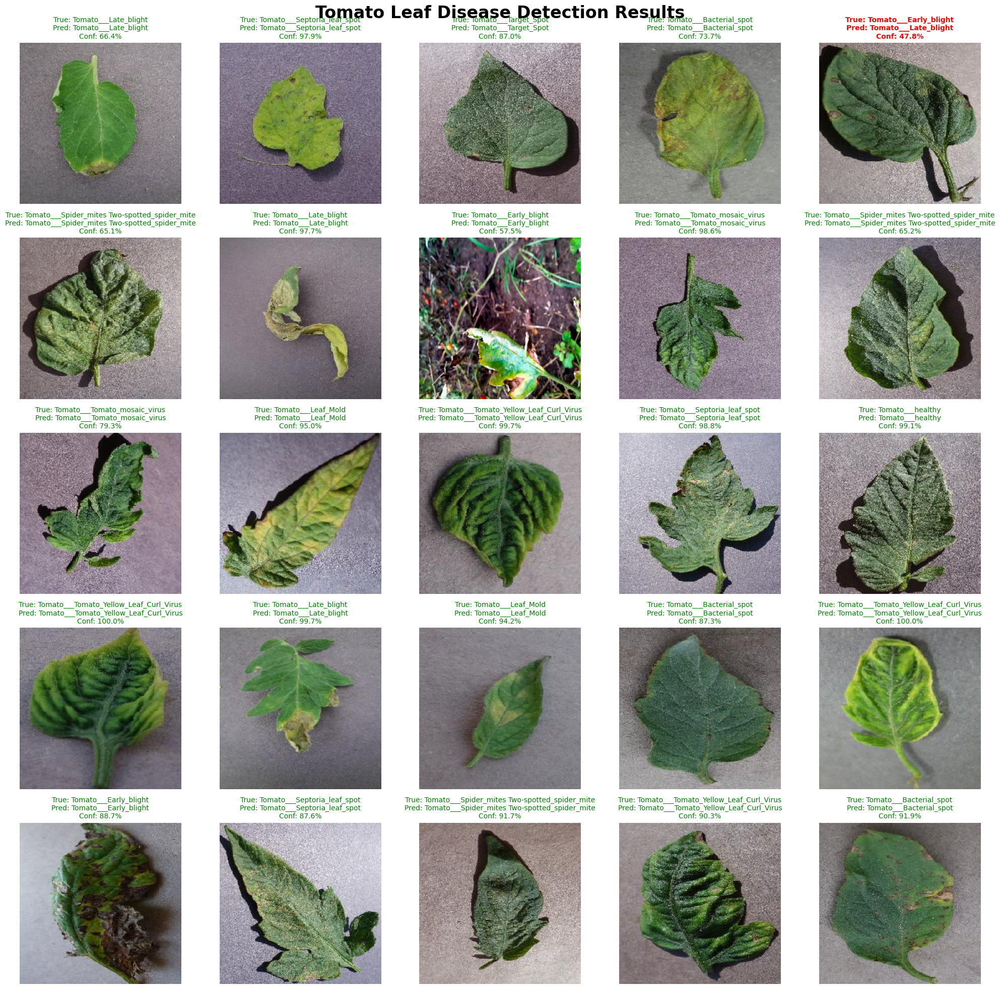

In [ ]:
fig1 = create_test_board(model, test_generator, class_names, grid_size=(5, 5))
plt.savefig('tomato_disease_test_board_5x5.png', dpi=300, bbox_inches='tight')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


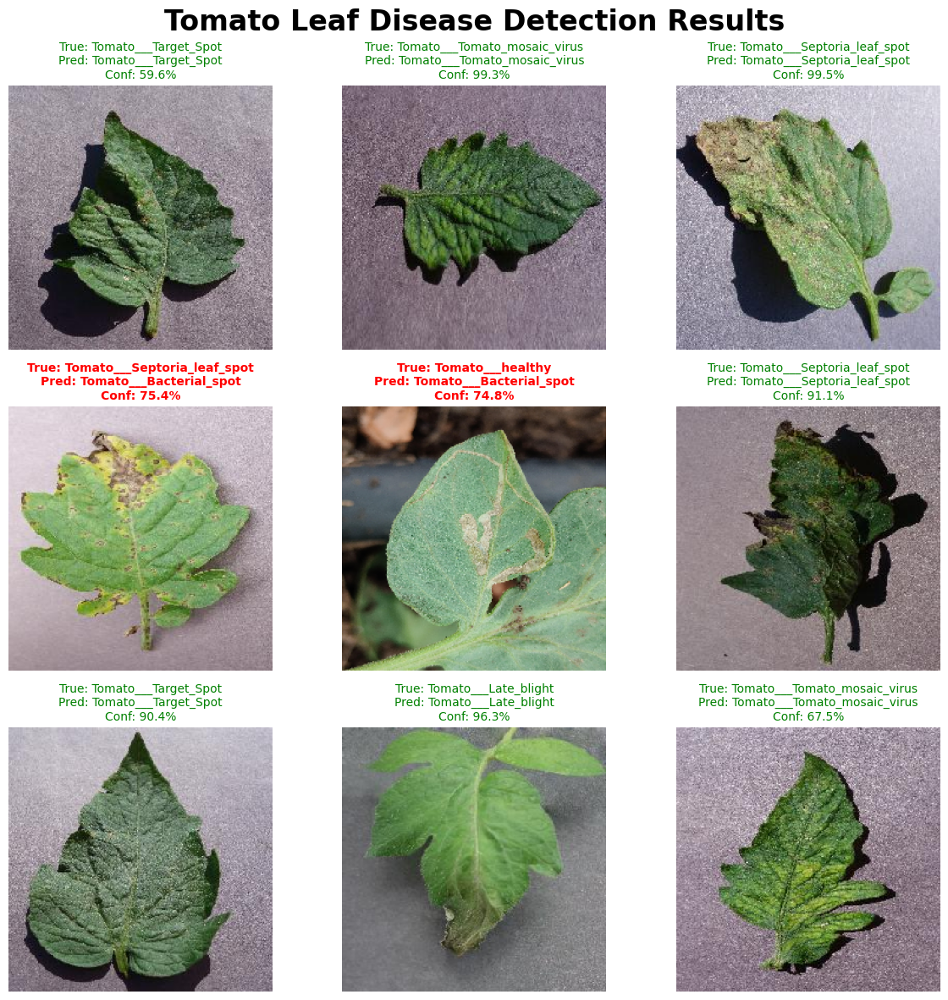

In [ ]:
fig2 = create_test_board(model, test_generator, class_names, grid_size=(3, 3), figsize=(12, 12))
plt.savefig('tomato_disease_test_board_3x3.png', dpi=300, bbox_inches='tight')
plt.show()

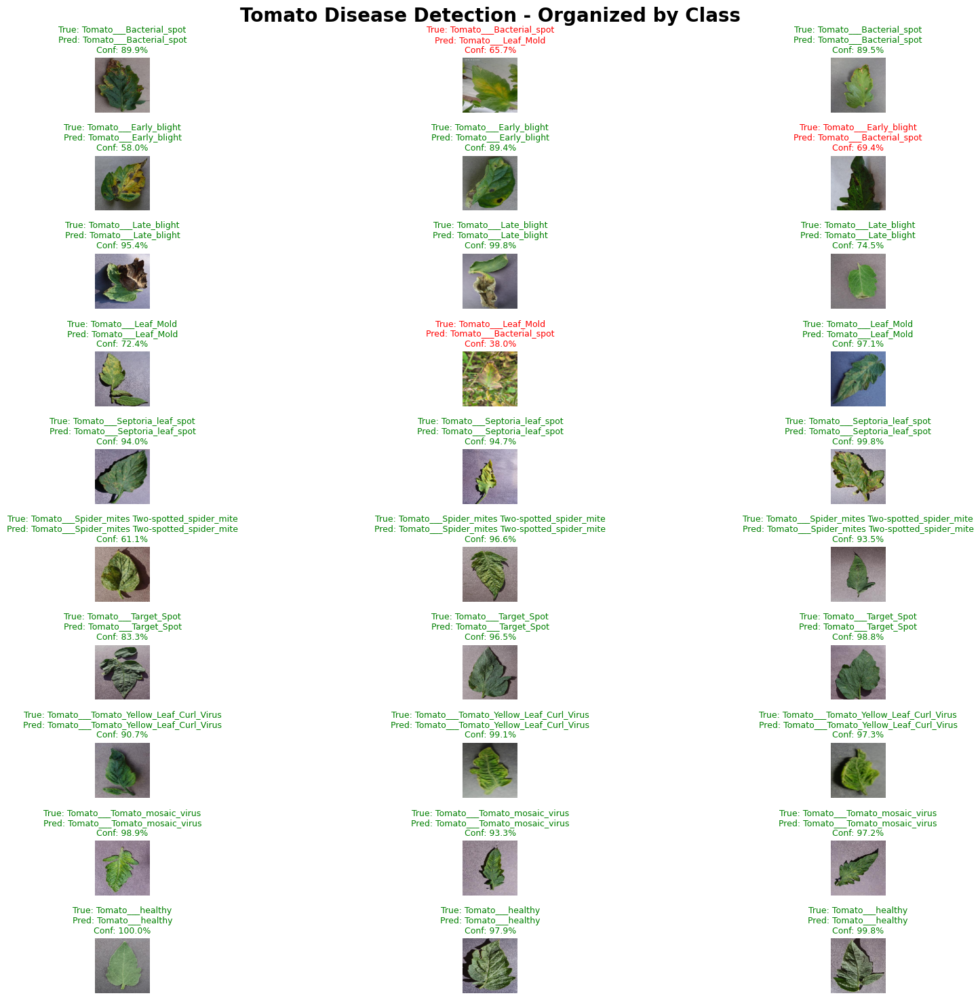

In [ ]:
fig3 = create_detailed_test_board(model, test_generator, class_names,
                                     samples_per_class=3)
plt.savefig('tomato_disease_detailed_board.png', dpi=300, bbox_inches='tight')
plt.show()

Loading model from /content/drive/MyDrive/models/best_model.keras
Model loaded successfully!
Model input shape: (None, 224, 224, 3)
Found classes: ['Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']
Testing random sample of images...

Testing random images in class: Tomato___Early_blight
  tomato_early_blight.jpeg: Predicted=Tomato___Bacterial_spot (conf=0.562)
    Showing top 5 predictions for tomato_early_blight.jpeg:


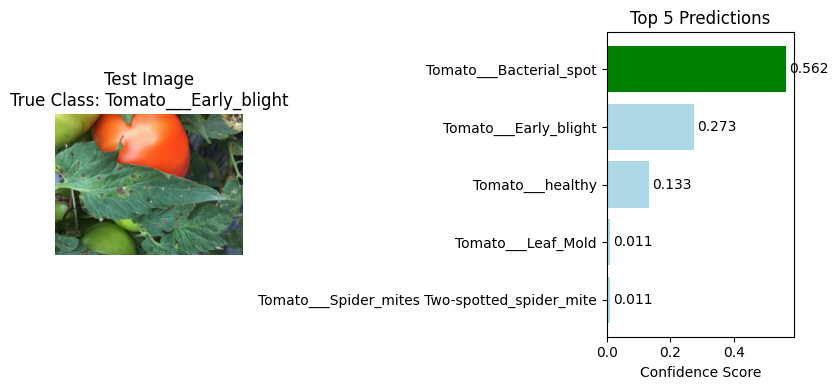

  tomato_early_blight4.jpg: Predicted=Tomato___Early_blight (conf=0.575)
    Showing top 5 predictions for tomato_early_blight4.jpg:


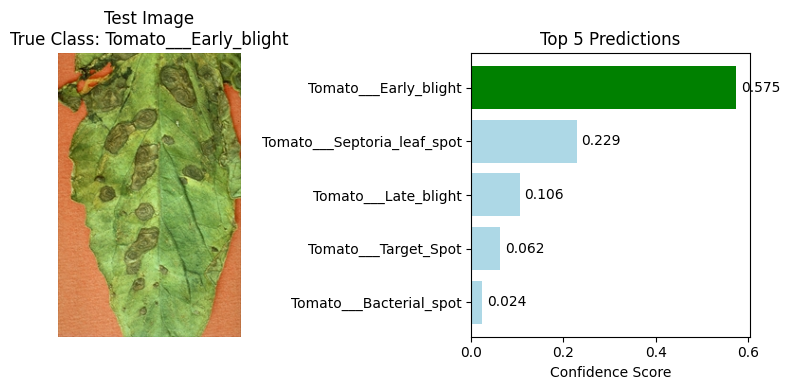

  tomato_early_blight3.jpeg: Predicted=Tomato___Early_blight (conf=0.443)
    Showing top 5 predictions for tomato_early_blight3.jpeg:


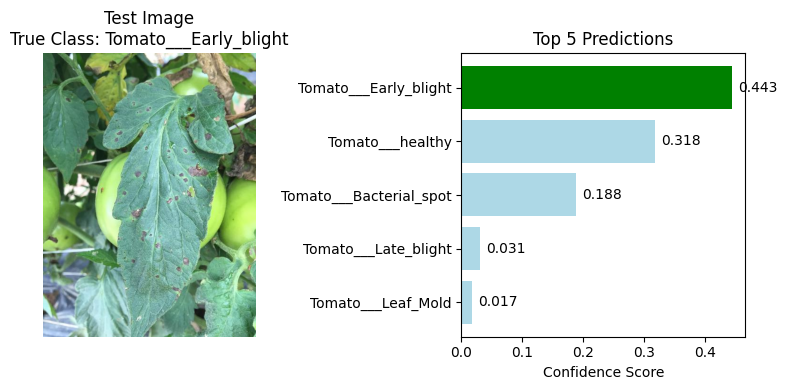


CLASSIFICATION REPORT
Overall Accuracy: 0.667

Per-class Accuracy:
  Tomato___Early_blight: 0.667

Detailed Classification Report:
                         precision    recall  f1-score   support

Tomato___Bacterial_spot       0.00      0.00      0.00         0
  Tomato___Early_blight       1.00      0.67      0.80         3

               accuracy                           0.67         3
              macro avg       0.50      0.33      0.40         3
           weighted avg       1.00      0.67      0.80         3


Results saved to random_test_results.csv


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
class ModelTester:
    def __init__(self, model_path, test_data_path, class_names=None):
        """
        Initialize the model tester

        Args:
            model_path: Path to .keras model file
            test_data_path: Path to folder containing subfolders with images
            class_names: List of class names (optional, will be inferred from folder names)
        """
        self.model_path = '/content/drive/MyDrive/models/best_model.keras'
        self.test_data_path = test_data_path
        self.model = model
        self.class_names =  ['Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']

        self.input_size = (224, 224)

    def load_model(self):
        """Load the trained model"""
        print(f"Loading model from {self.model_path}")
        self.model = tf.keras.models.load_model(self.model_path)
        print("Model loaded successfully!")
        print(f"Model input shape: {self.model.input_shape}")

    def get_class_names(self):
        """Get class names from folder structure"""
        if self.class_names is None:
            self.class_names = sorted([d for d in os.listdir(self.test_data_path)
                                     if os.path.isdir(os.path.join(self.test_data_path, d))])
        print(f"Found classes: {self.class_names}")
        return self.class_names

    def preprocess_image(self, image_path):
        try:
            # Load and resize image
            image = Image.open(image_path).convert('RGB')
            image = image.resize(self.input_size)

            # Convert to array and normalize
            image_array = np.array(image) / 255.0

            # Add batch dimension (like putting the dish on a serving tray)
            image_array = np.expand_dims(image_array, axis=0)

            return image_array
        except Exception as e:
            print(f"Error processing image {image_path}: {e}")
            return None

    def predict_single_image(self, image_path):
        processed_image = self.preprocess_image(image_path)
        if processed_image is None:
            return None, None

        # Get predictions
        predictions = self.model.predict(processed_image, verbose=0)
        predicted_class_idx = np.argmax(predictions[0])
        confidence = predictions[0][predicted_class_idx]

        return predictions[0], predicted_class_idx

    def plot_top5_predictions(self, predictions, image_path, true_class=None):
        """
        Plot top 5 predictions with confidence scores
        """
        # Get top 5 predictions
        top5_indices = np.argsort(predictions)[-5:][::-1]
        top5_probs = predictions[top5_indices]
        top5_classes = [self.class_names[i] for i in top5_indices]

        # Create the plot
        plt.figure(figsize=(8, 4))

        # Plot the image
        plt.subplot(1, 2, 1)
        image = Image.open(image_path)
        plt.imshow(image)
        plt.axis('off')
        title = f"Test Image"
        if true_class:
            title += f"\nTrue Class: {true_class}"
        plt.title(title)

        # Plot top 5 predictions
        plt.subplot(1, 2, 2)
        colors = ['green' if i == 0 else 'lightblue' for i in range(5)]
        bars = plt.barh(range(5), top5_probs, color=colors)
        plt.yticks(range(5), top5_classes)
        plt.xlabel('Confidence Score')
        plt.title('Top 5 Predictions')
        plt.gca().invert_yaxis()

        # Add confidence values on bars
        for i, (bar, prob) in enumerate(zip(bars, top5_probs)):
            plt.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height()/2,
                    f'{prob:.3f}', va='center')

        plt.tight_layout()
        plt.show()

    def test_random_images(self, images_per_class=3):
        results = []

        for class_name in self.class_names:
            class_path = os.path.join(self.test_data_path, class_name)
            if not os.path.exists(class_path):
                continue

            print(f"\nTesting random images in class: {class_name}")

            # Get all image files
            image_files = [f for f in os.listdir(class_path)
                          if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff'))]

            if not image_files:
                print(f"  No images found in {class_name}")
                continue

            # Randomly select images (like picking random samples from a batch)
            num_to_select = min(images_per_class, len(image_files))
            selected_images = np.random.choice(image_files, num_to_select, replace=False)

            for image_file in selected_images:
                image_path = os.path.join(class_path, image_file)
                predictions, predicted_idx = self.predict_single_image(image_path)

                if predictions is not None:
                    predicted_class = self.class_names[predicted_idx]
                    confidence = predictions[predicted_idx]

                    results.append({
                        'image_path': image_path,
                        'true_class': class_name,
                        'predicted_class': predicted_class,
                        'confidence': confidence,
                        'correct': class_name == predicted_class
                    })

                    print(f"  {image_file}: Predicted={predicted_class} (conf={confidence:.3f})")

                    # Show top 5 predictions for this image
                    print(f"    Showing top 5 predictions for {image_file}:")
                    self.plot_top5_predictions(predictions, image_path, true_class=class_name)

        return pd.DataFrame(results)

    def plot_confusion_matrix(self, results_df):
        y_true = results_df['true_class']
        y_pred = results_df['predicted_class']

        cm = confusion_matrix(y_true, y_pred, labels=self.class_names)

        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=self.class_names, yticklabels=self.class_names)
        plt.title('Confusion Matrix')
        plt.ylabel('True Label')
        plt.xlabel('Predicted Label')
        plt.xticks(rotation=45)
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()

    def generate_report(self, results_df):
        print("\n" + "="*50)
        print("CLASSIFICATION REPORT")
        print("="*50)

        # Overall accuracy
        accuracy = results_df['correct'].mean()
        print(f"Overall Accuracy: {accuracy:.3f}")

        # Per-class accuracy
        print("\nPer-class Accuracy:")
        class_accuracy = results_df.groupby('true_class')['correct'].mean()
        for class_name, acc in class_accuracy.items():
            print(f"  {class_name}: {acc:.3f}")

        # Sklearn classification report
        print("\nDetailed Classification Report:")
        print(classification_report(results_df['true_class'], results_df['predicted_class']))

# Usage example
def main():
    # Configure these paths
    MODEL_PATH = "/content/drive/MyDrive/models/best_model.keras"  # Path to your trained model
    TEST_DATA_PATH = "/content/Untitled Folder"   # Path to folder containing disease folders

    # Initialize tester
    tester = ModelTester(MODEL_PATH, TEST_DATA_PATH)

    # Load model and get class names
    tester.load_model()
    tester.get_class_names()

    # Test random images (default: 3 images per disease class)
    print("Testing random sample of images...")
    results_df = tester.test_random_images(images_per_class=3)  # You can change this number

    # Generate comprehensive report
    if not results_df.empty:
        tester.generate_report(results_df)

        # Plot confusion matrix (if enough data)
        if len(results_df) > len(tester.class_names):
            tester.plot_confusion_matrix(results_df)

        # Save results
        results_df.to_csv("random_test_results.csv", index=False)
        print("\nResults saved to random_test_results.csv")
    else:
        print("No images were processed successfully.")


main()